# SolarDET-YOLOV8 — Evaluación y Visualización

Notebook para evaluar el mejor checkpoint entrenado sobre el val set:

1. **§0** Configuración
2. **§1** Cargar modelo desde `checkpoint_best_total.pth`
3. **§2** Cargar ground truth desde COCO JSON
4. **§3** Inferencia sobre las 737 imágenes del val set
5. **§4** Métricas COCO (mAP@50:95, mAP@50, mAP@75, AP por clase)
6. **§5** Matriz de confusión
7. **§6** Visualización de detecciones (GT en verde, predicciones en colores)
8. **§7** Análisis de errores (imágenes con más FP / FN)

## §0 Configuración

In [2]:
EVAL_CONFIG = {
    # Checkpoint a evaluar
    "checkpoint": "/teamspace/studios/this_studio/PVmoduleDetection/runs/detect/Deteccion_Techos_PV/Prueba_YOLO_Medium/weights/best.pt",

    
    # Dataset (paths relativos al directorio del notebook)
    "dataset_dir": "/teamspace/studios/this_studio/PVmoduleDetection/pv-1",
    
    # Modelo
    "num_classes": 1,
    "resolution": 640,

    # Inferencia
    "threshold": 0.3,       # confianza mínima para predicciones
    "iou_threshold": 0.5,   # IoU para métricas y matriz de confusión
    "batch_size": 8,        # imágenes por llamada a model.predict()

    # Visualización
    "num_viz_samples": 16,  # imágenes en el grid aleatorio

    # Output
    "output_dir": "/teamspace/studios/this_studio/PVmoduleDetection/evaluacion_final",
    "seed": 42,
}

In [3]:
import json
import random
import sys
import torch  
import supervision as sv
from pathlib import Path
from ultralytics import YOLO

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from tqdm.auto import tqdm

# Asegura que el repositorio raíz esté en el path
sys.path.insert(0, str(Path("..").resolve()))

def set_global_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed) # Ahora torch ya está definido
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

# Cargar el modelo recién entrenado
model = YOLO(EVAL_CONFIG["checkpoint"])

print(f"Modelo YOLO cargado correctamente.")
print(f"Clases detectadas: {model.names}")

# Ejecutar la configuración de la semilla y directorios
set_global_seed(EVAL_CONFIG["seed"])
Path(EVAL_CONFIG["output_dir"]).mkdir(parents=True, exist_ok=True)

print(f"Supervision: {sv.__version__}")
print(f"Output dir:  {EVAL_CONFIG['output_dir']}")

Modelo YOLO cargado correctamente.
Clases detectadas: {0: '0'}
Supervision: 0.27.0.post1
Output dir:  /teamspace/studios/this_studio/PVmoduleDetection/evaluacion_final


## §1 Cargar modelo desde el mejor checkpoint

Se instancia el modelo pasando `pretrain_weights` apuntando al checkpoint guardado en disco.  
Esto carga los pesos finetuneados (no los de COCO).

In [4]:
best_ckpt = Path(EVAL_CONFIG["checkpoint"])
assert best_ckpt.exists(), (
    f"Checkpoint no encontrado: {best_ckpt.resolve()}\n"
    "Asegúrate de haber entrenado el modelo primero."
)

# Cargamos el modelo YOLO directamente usando la ruta del checkpoint
# Esto reemplaza a VARIANT_MAP y model_cls
model = YOLO(str(best_ckpt))

print(f"Checkpoint cargado: {best_ckpt}  ({best_ckpt.stat().st_size / 1024**2:.1f} MB)")
print(f"\nClases del modelo ({len(model.names)}):")
for cid, name in model.names.items():
    print(f"  {cid}: {name}")

Checkpoint cargado: /teamspace/studios/this_studio/PVmoduleDetection/runs/detect/Deteccion_Techos_PV/Prueba_YOLO_Medium/weights/best.pt  (49.6 MB)

Clases del modelo (1):
  0: 0


## §2 Cargar ground truth desde COCO JSON

Parsea `valid/_annotations.coco.json` y construye un dict `filename → sv.Detections`.  
El mapeo de `category_id` → `class_id` replica el algoritmo de `rfdetr._load_classes`
para garantizar alineación con el modelo.

In [6]:
def load_yolo_ground_truth(dataset_dir: str):
    """
    Carga el ground truth del split 'valid' usando el formato YOLO.
    """
    # Construimos las rutas a las imágenes y etiquetas de validación
    val_path = Path(dataset_dir) / "valid"
    images_path = val_path / "images"
    annotations_path = val_path / "labels"
    data_yaml_path = Path(dataset_dir) / "data.yaml"

    # Cargamos el dataset usando la función nativa de supervision
    dataset = sv.DetectionDataset.from_yolo(
        images_directory_path=str(images_path),
        annotations_directory_path=str(annotations_path),
        data_yaml_path=str(data_yaml_path)
    )

    # Convertimos a un diccionario {filename: sv.Detections}
    gt_by_filename = {
        Path(path).name: detections 
        for path, _, detections in dataset
    }
    
    return gt_by_filename, dataset.classes

# Llamamos a la nueva función
gt_by_filename, CLASS_NAMES = load_yolo_ground_truth(EVAL_CONFIG["dataset_dir"])

print(f"Imágenes en val set: {len(gt_by_filename)}")
total_gt_boxes = sum(len(d) for d in gt_by_filename.values())
print(f"Total GT boxes:      {total_gt_boxes}")
print(f"\nClases ({len(CLASS_NAMES)}): {CLASS_NAMES}")

gt_by_filename, CLASS_NAMES = load_yolo_ground_truth(EVAL_CONFIG["dataset_dir"])

print(f"Imágenes en val set: {len(gt_by_filename)}")
total_gt_boxes = sum(len(d) for d in gt_by_filename.values())
print(f"Total GT boxes:      {total_gt_boxes}")
print(f"\nClases ({len(CLASS_NAMES)}): {CLASS_NAMES}")

print("\nVerificación de alineación clase modelo ↔ GT:")
all_ok = True
for i, gt_name in enumerate(CLASS_NAMES):
    # En YOLO las clases están en model.names y son 0-indexadas
    model_name = model.names.get(i, "?") 
    ok = gt_name == model_name
    all_ok = all_ok and ok
    print(f"  [{i:2d}] GT='{gt_name}'  modelo='{model_name}'  {'✓' if ok else '✗ MISMATCH'}")

print(f"\n{'✓ Alineación correcta' if all_ok else '✗ Hay desalineación — revisar mapeo'}")

Imágenes en val set: 583
Total GT boxes:      1980

Clases (1): ['0']
Imágenes en val set: 583
Total GT boxes:      1980

Clases (1): ['0']

Verificación de alineación clase modelo ↔ GT:
  [ 0] GT='0'  modelo='0'  ✓

✓ Alineación correcta


## §3 Inferencia sobre el val set completo

Se procesan las imágenes en batches para eficiencia.  
Las listas `all_predictions` y `all_targets` quedan alineadas por índice.

In [7]:
# Definimos la ruta a las imágenes de validación
val_images_dir = Path(EVAL_CONFIG["dataset_dir"]) / "valid" / "images"
all_filenames = sorted(gt_by_filename.keys())
batch_size = EVAL_CONFIG["batch_size"]

all_predictions = []
all_targets = []

# Iniciamos el bucle de inferencia
for i in tqdm(range(0, len(all_filenames), batch_size), desc="Inferencia val set"):
    batch_fnames = all_filenames[i : i + batch_size]
    batch_paths = [str(val_images_dir / fn) for fn in batch_fnames]

    # Ejecutamos la predicción con YOLO
    # Usamos imgsz y conf definidos en tu EVAL_CONFIG
    results = model.predict(
        source=batch_paths, 
        imgsz=EVAL_CONFIG["resolution"], 
        conf=EVAL_CONFIG["threshold"],
        verbose=False
    )

    for fn, res in zip(batch_fnames, results):
        # Convertimos el resultado de YOLO al formato de Supervision
        pred = sv.Detections.from_ultralytics(res)
        
        all_predictions.append(pred)
        all_targets.append(gt_by_filename[fn])

# Resumen de lo procesado
total_preds = sum(len(d) for d in all_predictions)
total_gts = sum(len(d) for d in all_targets)
print(f"\nImágenes procesadas:        {len(all_predictions)}")
print(f"Total predicciones:         {total_preds}")
print(f"Total GT boxes (Realidad):  {total_gts}")

Inferencia val set:   0%|          | 0/73 [00:00<?, ?it/s]


Imágenes procesadas:        583
Total predicciones:         2045
Total GT boxes (Realidad):  1980


## §4 Métricas COCO

Se calculan mAP@50:95, mAP@50, mAP@75 globales y AP@50:95 por clase  
usando `supervision.MeanAveragePrecision`.

In [8]:
from supervision.metrics import MeanAveragePrecision as MAP

# Calculamos las métricas comparando predicciones contra realidad
map_metric = MAP()
map_result = map_metric.update(all_predictions, all_targets).compute()

print("=" * 52)
print("  MÉTRICAS COCO — Val set")
print("=" * 52)
print(f"  mAP@50:95  =  {map_result.map50_95:.4f}   ({map_result.map50_95 * 100:.1f}%)")
print(f"  mAP@50     =  {map_result.map50:.4f}   ({map_result.map50 * 100:.1f}%)")
print(f"  mAP@75     =  {map_result.map75:.4f}   ({map_result.map75 * 100:.1f}%)")
print("=" * 52)

# Guardar métricas en un archivo JSON para tu reporte
import json as _json
metrics_summary = {
    "map50_95": float(map_result.map50_95),
    "map50":    float(map_result.map50),
    "map75":    float(map_result.map75),
    "predictions": total_preds,
    "ground_truth": total_gts
}
out_path = Path(EVAL_CONFIG["output_dir"]) / "metrics_global.json"
out_path.write_text(_json.dumps(metrics_summary, indent=2))
print(f"Métricas guardadas en: {out_path}")

  MÉTRICAS COCO — Val set
  mAP@50:95  =  0.8626   (86.3%)
  mAP@50     =  0.9548   (95.5%)
  mAP@75     =  0.9318   (93.2%)
Métricas guardadas en: /teamspace/studios/this_studio/PVmoduleDetection/evaluacion_final/metrics_global.json


Clase                          AP@50:95
----------------------------------------
  Panel Fotovoltaico             86.3%
----------------------------------------
  MEDIA GLOBAL                   86.3%


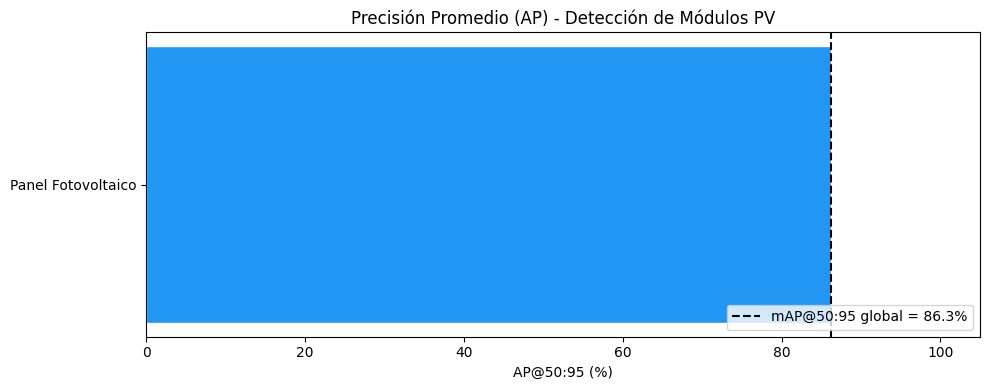

Archivos de métricas guardados en: /teamspace/studios/this_studio/PVmoduleDetection/evaluacion_final


In [10]:
import pandas as pd
# ap_per_class: lista de arrays por clase
ap_arrays = np.array(map_result.ap_per_class)          
matched_cls = list(map_result.matched_classes)         

# Construir vector AP@50:95
per_class_ap = np.zeros(len(CLASS_NAMES), dtype=np.float32)
for i, cid in enumerate(matched_cls):
    if cid < len(CLASS_NAMES):
        per_class_ap[cid] = float(ap_arrays[i].mean())

# Tabla de métricas para el reporte
print(f"{'Clase':<28} {'AP@50:95':>10}")
print("-" * 40)
sorted_idx = np.argsort(per_class_ap)[::-1]
for i in sorted_idx:
    # Si el nombre es solo '0', lo renombramos visualmente para el print
    name = "Panel Fotovoltaico" if CLASS_NAMES[i] == '0' else CLASS_NAMES[i]
    print(f"  {name:<26} {per_class_ap[i] * 100:>8.1f}%")
print("-" * 40)
print(f"  {'MEDIA GLOBAL':<26} {per_class_ap.mean() * 100:>8.1f}%")

# Gráfico de barras (Ajustado el título)
fig, ax = plt.subplots(figsize=(10, 4)) # Más pequeño porque es una sola clase[cite: 1]
display_names = ["Panel Fotovoltaico" if CLASS_NAMES[i] == '0' else CLASS_NAMES[i] for i in sorted_idx]
display_values = per_class_ap[sorted_idx] * 100

bars = ax.barh(display_names, display_values, color="#2196F3", edgecolor="white", height=0.4)
ax.axvline(
    map_result.map50_95 * 100,
    color="black", linestyle="--", linewidth=1.5,
    label=f"mAP@50:95 global = {map_result.map50_95 * 100:.1f}%",
)

ax.set_xlabel("AP@50:95 (%)")
ax.set_xlim(0, 105)
ax.set_title("Precisión Promedio (AP) - Detección de Módulos PV") # Título corregido[cite: 1]
ax.legend(loc="lower right")
plt.tight_layout()

# Guardado de archivos para la tesis[cite: 1]
out_path = Path(EVAL_CONFIG["output_dir"]) / "precision_por_clase.png"
plt.savefig(out_path, dpi=150, bbox_inches="tight")
plt.show()

# Guardar CSV formal[cite: 1]
df_ap = pd.DataFrame({
    "clase": ["Módulo PV" if c == '0' else c for c in CLASS_NAMES],
    "ap50_95": per_class_ap.tolist(),
})
out_path = Path(EVAL_CONFIG["output_dir"]) / "metricas_precision.csv"
df_ap.to_csv(out_path, index=False, float_format="%.4f")
print(f"Archivos de métricas guardados en: {EVAL_CONFIG['output_dir']}")

## §5 Matriz de confusión

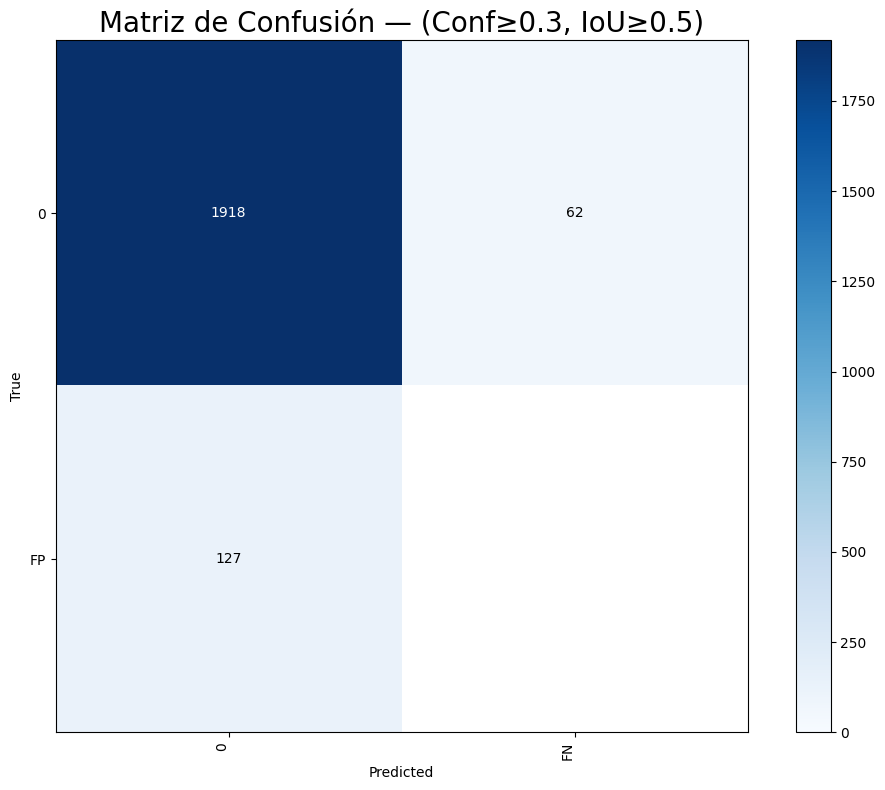

In [11]:
conf_matrix = sv.ConfusionMatrix.from_detections(
    predictions=all_predictions,
    targets=all_targets,
    classes=CLASS_NAMES,
    conf_threshold=EVAL_CONFIG["threshold"],
    iou_threshold=EVAL_CONFIG["iou_threshold"],
)

# Graficar la matriz
fig = conf_matrix.plot(
    title=f"Matriz de Confusión — (Conf≥{EVAL_CONFIG['threshold']}, IoU≥{EVAL_CONFIG['iou_threshold']})",
    fig_size=(10, 8),
)

# Guardar la imagen para tu documento de tesis
out_path = Path(EVAL_CONFIG["output_dir"]) / "confusion_matrix.png"
plt.savefig(out_path, dpi=150, bbox_inches="tight")
plt.show()

## §6 Visualización de detecciones

Grid de imágenes con:
- **Verde** — bounding boxes del ground truth
- **Colores** — predicciones con etiqueta `clase conf`

✅ Imagen guardada en: /teamspace/studios/this_studio/PVmoduleDetection/evaluacion_final/detections_grid.png


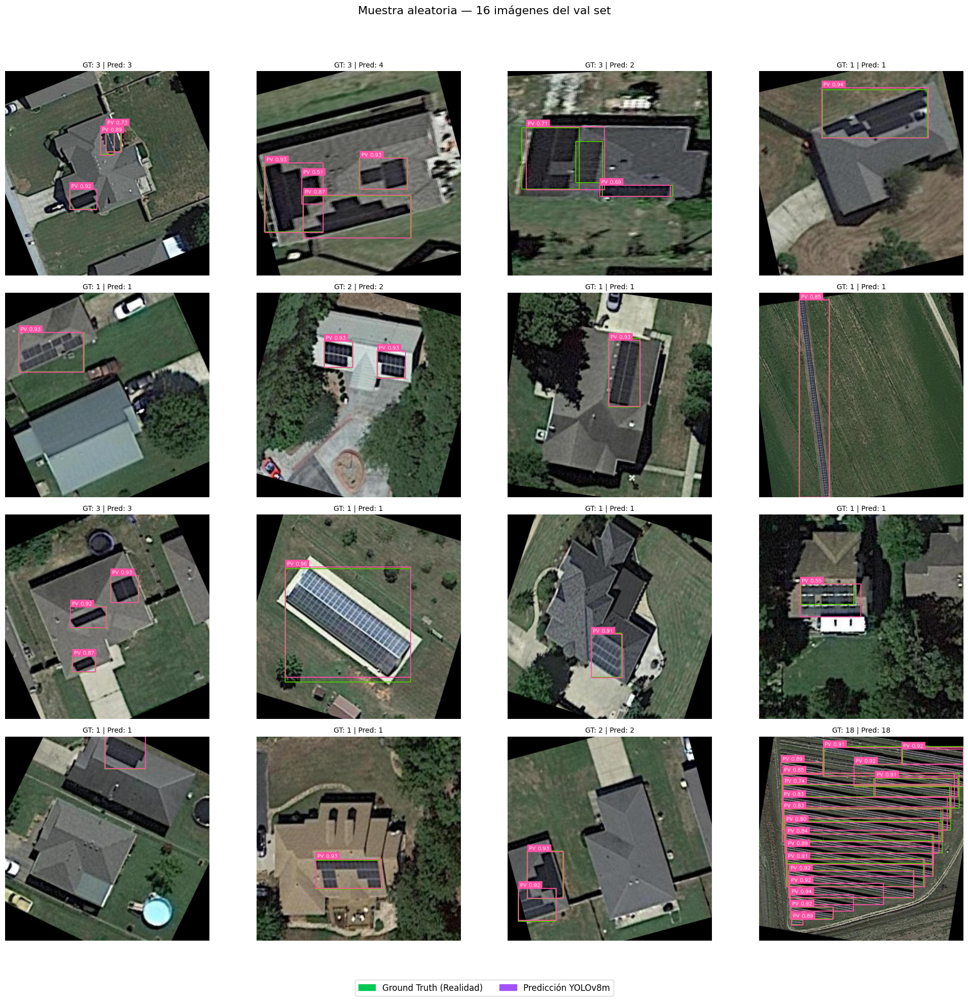

In [14]:
import matplotlib.patches as mpatches
from PIL import Image
import random

# 1. Definimos la función completa con soporte para guardar archivos
def visualize_detections_grid(
    filenames, 
    val_dir, 
    predictions, 
    targets, 
    class_names, 
    n_cols=4, 
    title="Detecciones", 
    save_path=None
):
    n = len(filenames)
    n_rows = (n + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))
    axes_flat = np.array(axes).flatten()

    box_annotator = sv.BoxAnnotator(thickness=2)
    label_annotator = sv.LabelAnnotator(text_scale=0.5, text_padding=5)

    for ax, fname, pred, gt in zip(axes_flat, filenames, predictions, targets):
        img_path = val_dir / fname
        if not img_path.exists(): continue # Salta si no existe la imagen
        
        img_np = np.array(Image.open(img_path).convert("RGB"))

        # Dibujamos GT en verde
        scene = sv.BoxAnnotator(color=sv.Color.from_hex("#00C853"), thickness=2).annotate(
            scene=img_np.copy(), detections=gt
        )

        # Dibujamos predicciones YOLO
        scene = box_annotator.annotate(scene=scene, detections=pred)
        labels = [f"PV {conf:.2f}" for conf in pred.confidence]
        scene = label_annotator.annotate(scene=scene, detections=pred, labels=labels)

        ax.imshow(scene)
        ax.set_title(f"GT: {len(gt)} | Pred: {len(pred)}", fontsize=10)
        ax.axis("off")

    # Leyenda para la defensa de tesis
    green_patch = mpatches.Patch(color='#00C853', label='Ground Truth (Realidad)')
    blue_patch = mpatches.Patch(color='#A351FB', label='Predicción YOLOv8m')
    fig.legend(handles=[green_patch, blue_patch], loc='lower center', ncol=2, fontsize=12)
    fig.suptitle(title, fontsize=16)

    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    
    # Guardado automático[cite: 1]
    if save_path is not None:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"✅ Imagen guardada en: {save_path}")
    
    plt.show()

# 2. Ejecución del script que compartiste (ajustado para YOLO)[cite: 1]
random.seed(EVAL_CONFIG["seed"])
n_samples = EVAL_CONFIG["num_viz_samples"]
sample_idx = random.sample(range(len(all_filenames)), min(n_samples, len(all_filenames)))

# Nota: Usamos 'val_images_dir' porque YOLO separa imágenes de etiquetas[cite: 1]
val_images_dir = Path(EVAL_CONFIG["dataset_dir"]) / "valid" / "images"

visualize_detections_grid(
    filenames=[all_filenames[i] for i in sample_idx],
    val_dir=val_images_dir,
    predictions=[all_predictions[i] for i in sample_idx],
    targets=[all_targets[i] for i in sample_idx],
    class_names=CLASS_NAMES,
    n_cols=4,
    title=f"Muestra aleatoria — {n_samples} imágenes del val set",
    save_path=Path(EVAL_CONFIG["output_dir"]) / "detections_grid.png", # Se guarda en tu carpeta de resultados[cite: 1]
)

## §7 Análisis de errores

Identifica las imágenes donde el modelo comete más errores:
- **Falsos Positivos (FP)**: el modelo predice cajas que no corresponden a GT
- **Falsos Negativos (FN)**: el modelo no detecta cajas GT existentes

In [16]:
# 1. Primero definimos la función que falta
def count_fp_fn(pred, gt, iou_thr=0.5):
    """Cuenta Falsos Positivos y Falsos Negativos por imagen usando greedy IoU matching."""
    if len(gt) == 0: 
        return len(pred), 0
    if len(pred) == 0: 
        return 0, len(gt)

    iou_mat = sv.box_iou_batch(pred.xyxy, gt.xyxy)
    matched_preds = set()
    matched_gts = set()

    # Ordenar emparejamientos por IoU de forma descendente
    pairs = sorted(
        [(iou_mat[pi, gi], pi, gi) for pi in range(len(pred)) for gi in range(len(gt))],
        reverse=True,
    )
    for iou, pi, gi in pairs:
        if iou < iou_thr:
            break
        if pi not in matched_preds and gi not in matched_gts:
            matched_preds.add(pi)
            matched_gts.add(gi)

    fp = len(pred) - len(matched_preds)
    fn = len(gt) - len(matched_gts)
    return fp, fn

# 2. Ahora ya podemos realizar el cálculo de errores por imagen
val_images_dir = Path(EVAL_CONFIG["dataset_dir"]) / "valid" / "images"

errors = [
    count_fp_fn(pred, gt, EVAL_CONFIG["iou_threshold"])
    for pred, gt in zip(all_predictions, all_targets)
]
fp_counts = [x[0] for x in errors]
fn_counts = [x[1] for x in errors]

# 3. Imprimimos el resumen de calidad de tu tesis
total_fp = sum(fp_counts)
total_fn = sum(fn_counts)
print(f"Total Falsos Positivos (Extra): {total_fp}")
print(f"Total Falsos Negativos (Omitidos): {total_fn}")

Total Falsos Positivos (Extra): 126
Total Falsos Negativos (Omitidos): 61


------------------------------
RESUMEN DE ERRORES (Val Set)
------------------------------
Total Falsos Positivos (Detecciones extra):  126
Total Falsos Negativos (Paneles omitidos):   61
Precisión (conteo): 93.8%
Recall (conteo):    96.9%


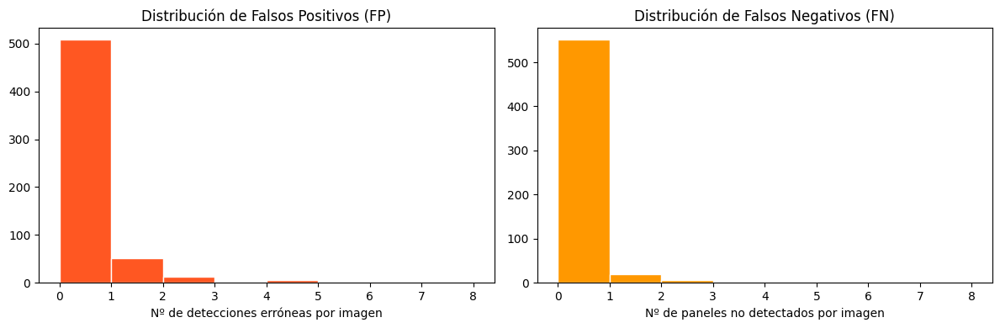


Analizando imágenes con más Falsos Positivos...
✅ Imagen guardada en: /teamspace/studios/this_studio/PVmoduleDetection/evaluacion_final/peores_fp.png


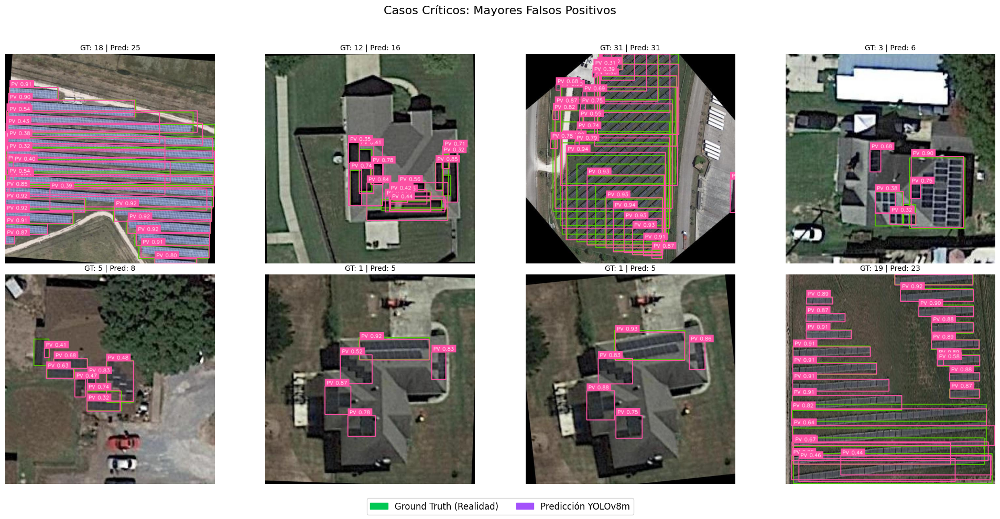


Analizando imágenes con más Falsos Negativos...
✅ Imagen guardada en: /teamspace/studios/this_studio/PVmoduleDetection/evaluacion_final/peores_fn.png


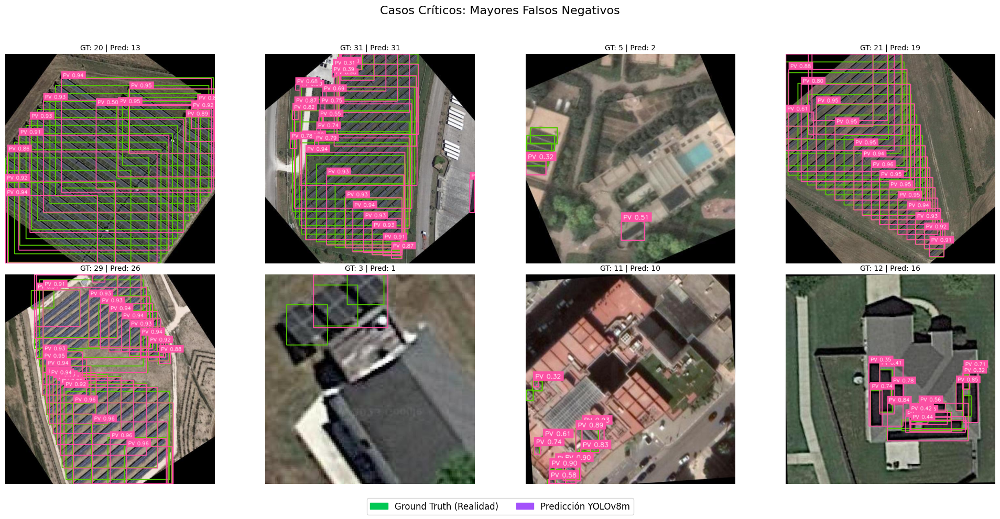

In [17]:
# 1. Definimos la ruta correcta a las imágenes (Formato YOLOv8)
val_images_dir = Path(EVAL_CONFIG["dataset_dir"]) / "valid" / "images"

# 2. Cálculo de errores por imagen
errors = [
    count_fp_fn(pred, gt, EVAL_CONFIG["iou_threshold"])
    for pred, gt in zip(all_predictions, all_targets)
]
fp_counts = [x[0] for x in errors]
fn_counts = [x[1] for x in errors]

# 3. Resumen estadístico para tu reporte
total_fp = sum(fp_counts)
total_fn = sum(fn_counts)
print("-" * 30)
print(f"RESUMEN DE ERRORES (Val Set)")
print("-" * 30)
print(f"Total Falsos Positivos (Detecciones extra):  {total_fp}")
print(f"Total Falsos Negativos (Paneles omitidos):   {total_fn}")
# Cálculo de métricas basadas en conteo manual
precision_conteo = (total_preds - total_fp) / max(total_preds, 1)
recall_conteo = (total_gts - total_fn) / max(total_gts, 1)
print(f"Precisión (conteo): {precision_conteo * 100:.1f}%")
print(f"Recall (conteo):    {recall_conteo * 100:.1f}%")

# 4. Generación de Histogramas para la tesis
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(fp_counts, bins=range(max(fp_counts) + 2), color="#FF5722", edgecolor="white")
axes[0].set_title("Distribución de Falsos Positivos (FP)")
axes[0].set_xlabel("Nº de detecciones erróneas por imagen")

axes[1].hist(fn_counts, bins=range(max(fn_counts) + 2), color="#FF9800", edgecolor="white")
axes[1].set_title("Distribución de Falsos Negativos (FN)")
axes[1].set_xlabel("Nº de paneles no detectados por imagen")

plt.tight_layout()
plt.savefig(Path(EVAL_CONFIG["output_dir"]) / "distribucion_errores.png", dpi=150)
plt.show()

# 5. Visualización de los "Peores Escenarios"
# Top-8 imágenes con más Falsos Positivos (FP)[cite: 1]
top_fp_idx = sorted(range(len(fp_counts)), key=lambda i: fp_counts[i], reverse=True)[:8]
print("\nAnalizando imágenes con más Falsos Positivos...")
visualize_detections_grid(
    filenames=[all_filenames[i] for i in top_fp_idx],
    val_dir=val_images_dir, # Usamos la ruta corregida[cite: 1]
    predictions=[all_predictions[i] for i in top_fp_idx],
    targets=[all_targets[i] for i in top_fp_idx],
    class_names=CLASS_NAMES,
    n_cols=4,
    title="Casos Críticos: Mayores Falsos Positivos",
    save_path=Path(EVAL_CONFIG["output_dir"]) / "peores_fp.png"
)

# Top-8 imágenes con más Falsos Negativos (FN)[cite: 1]
top_fn_idx = sorted(range(len(fn_counts)), key=lambda i: fn_counts[i], reverse=True)[:8]
print("\nAnalizando imágenes con más Falsos Negativos...")
visualize_detections_grid(
    filenames=[all_filenames[i] for i in top_fn_idx],
    val_dir=val_images_dir, # Usamos la ruta corregida[cite: 1]
    predictions=[all_predictions[i] for i in top_fn_idx],
    targets=[all_targets[i] for i in top_fn_idx],
    class_names=CLASS_NAMES,
    n_cols=4,
    title="Casos Críticos: Mayores Falsos Negativos",
    save_path=Path(EVAL_CONFIG["output_dir"]) / "peores_fn.png"
)